In [1]:
import warnings
warnings.filterwarnings('ignore')
import tensorflow as tf
tf.logging.set_verbosity(tf.logging.ERROR)
from utils.DocumentSegmenation import DocSegModel
%matplotlib inline
from matplotlib import pyplot as plt
import cv2, os
import random
import numpy as np
from utils.QuadCorners import get_corners

### Load the model and test it with sample images

In [2]:
## Specify the input size and the dataset which is trained. 
docSegM = DocSegModel()

In [3]:
image_path = './samples'
images = [os.path.join(image_path,f) for f in os.listdir(image_path) if 'png' in f or 'jpg' in f or 'jpeg' in f ]

## Select 10 random images for test
NUM_TO_TEST = 40
random.Random(1).shuffle(images)
results = [docSegM.predict(image) for image in images[:NUM_TO_TEST]]

In [4]:
for i,image in enumerate(images[:NUM_TO_TEST]):
    img = cv2.imread(image)
    #c0, c1, c2, c3 = list(get_corners(mask.astype(np.uint8)))
    corners_l = list(get_corners(results[i][0].astype(np.uint8)))
    corners_l.sort(key=lambda x: np.sum(x))

    c0, c1, c2, c3 = corners_l[0],corners_l[1],corners_l[2],corners_l[3]

    cv2.line(img, tuple(c0.astype(np.uint32)), tuple(c1.astype(np.uint32)), [255, 0, 0], 3)
    cv2.line(img, tuple(c0.astype(np.uint32)), tuple(c2.astype(np.uint32)), [255, 0, 0], 3)
    cv2.line(img, tuple(c3.astype(np.uint32)), tuple(c1.astype(np.uint32)), [255, 0, 0], 3)
    cv2.line(img, tuple(c3.astype(np.uint32)), tuple(c2.astype(np.uint32)), [255, 0, 0], 3)
    results[i] = (results[i][0],img)

### Visualize  image and the predicted foreground

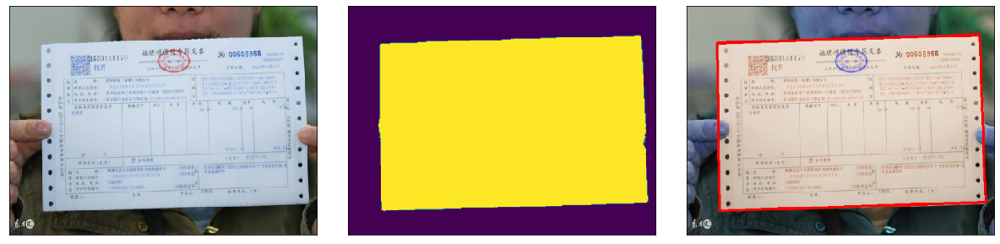

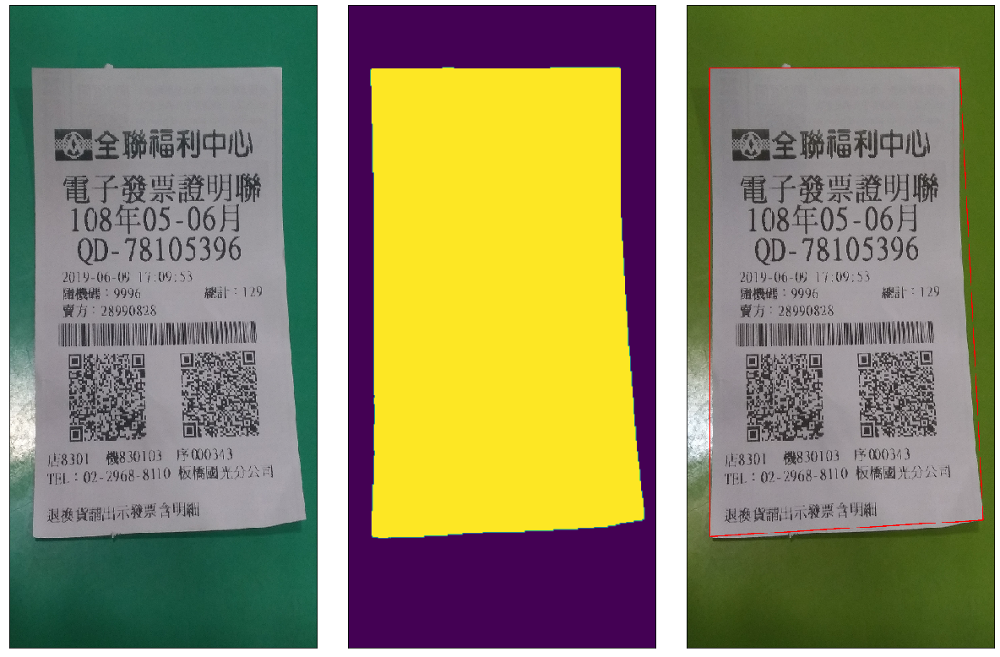

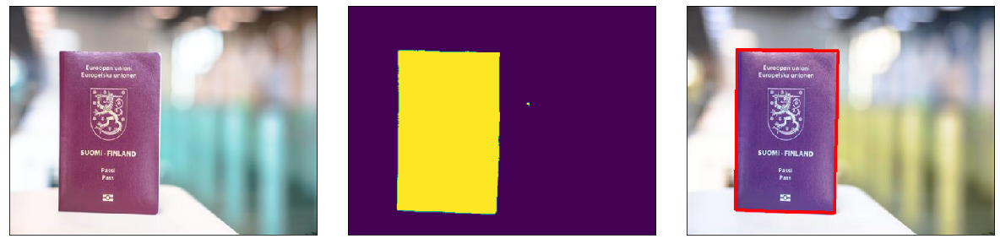

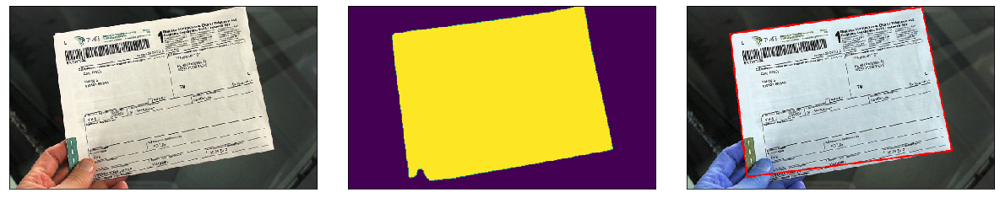

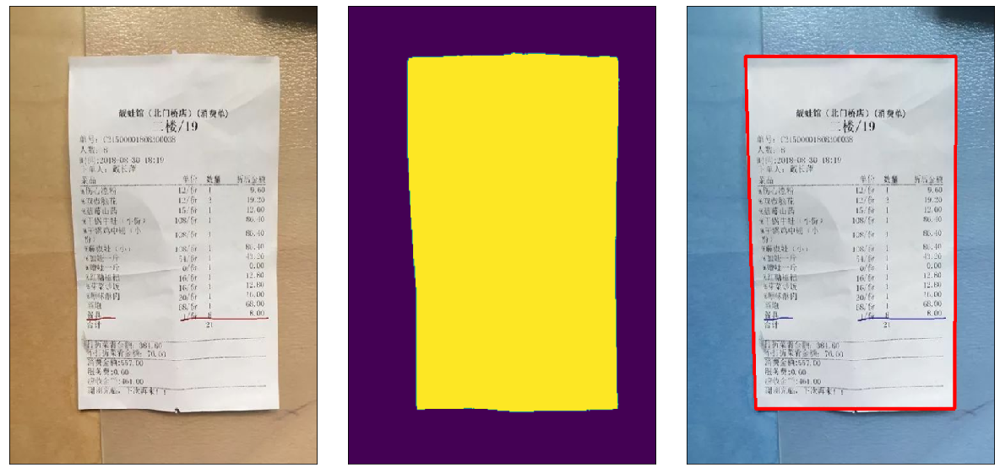

...

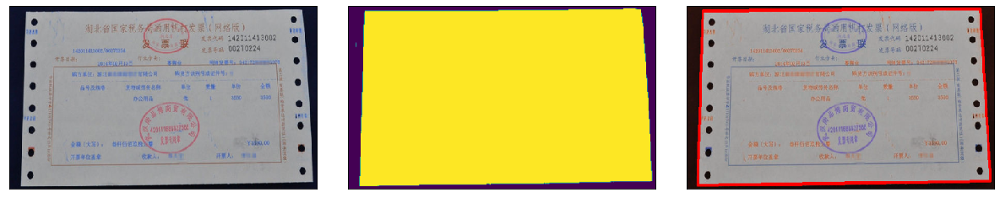

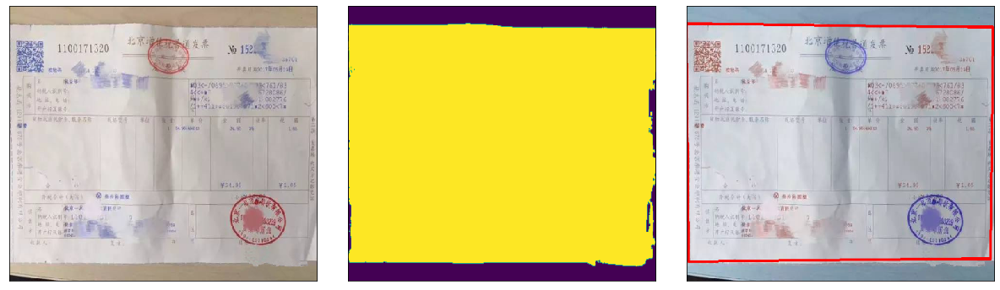

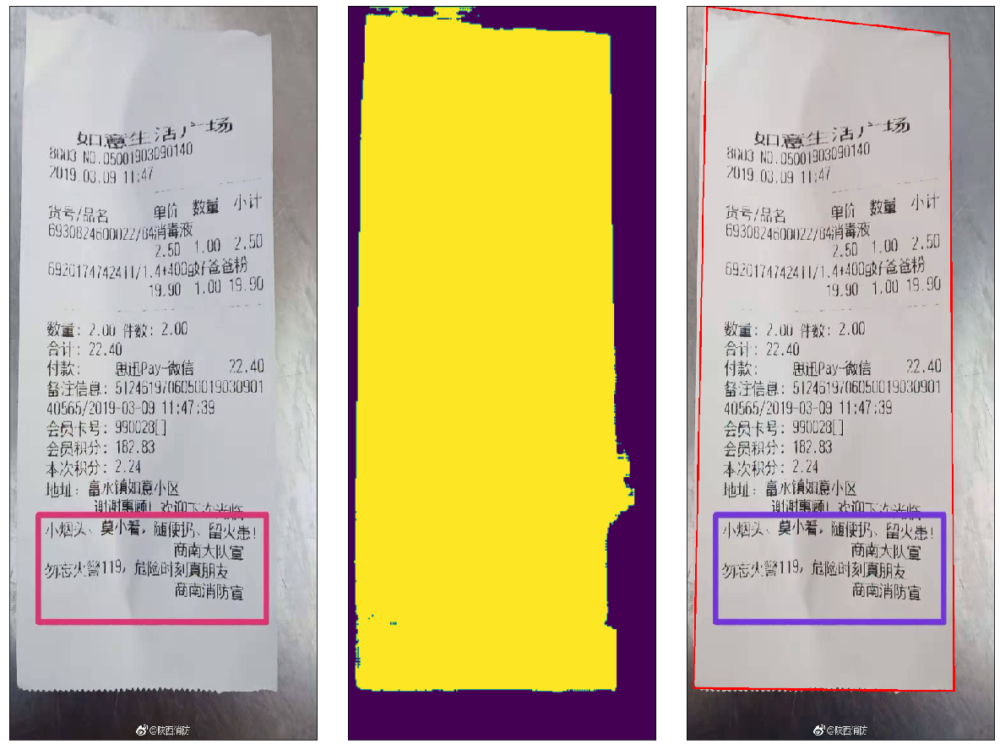

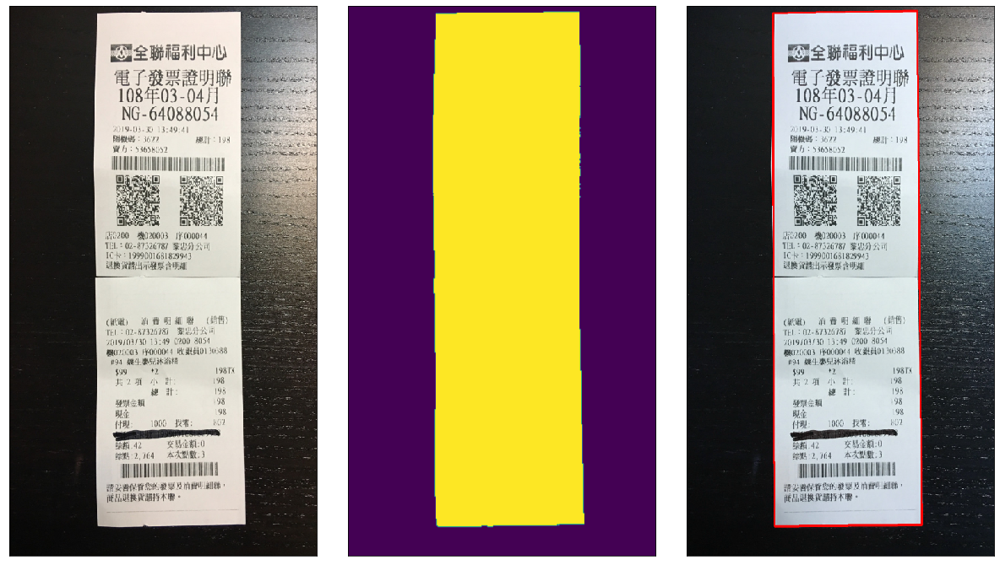

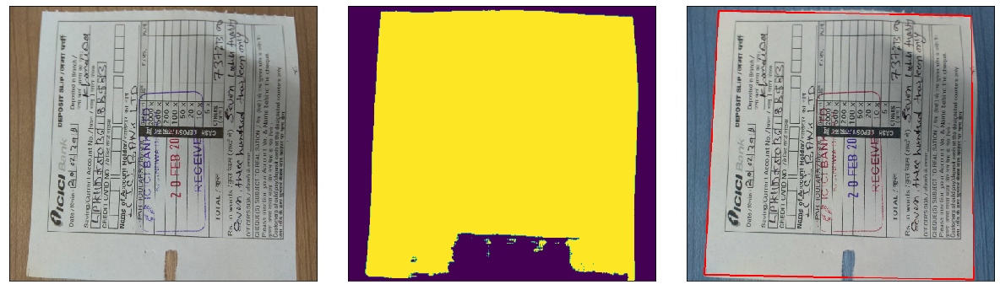

In [5]:
num_to_display = min(NUM_TO_TEST, len(images)) 
for i in range(num_to_display):
    img = cv2.cvtColor(cv2.imread(images[i]),cv2.COLOR_BGR2RGB)
    w, h = img.shape[:2]
    tgt_width = 500
    tgt_height = int(tgt_width*w/h)
    
    fig=plt.figure(figsize=(18, int(16*tgt_height/(2*tgt_width))))     
    
    fig.add_subplot(1, 3, 1)
    plt.subplots_adjust(wspace=0.0001, hspace=0.0001, right=0.95, left= 0.05)
    plt.xticks([])
    plt.yticks([])
    resized = cv2.resize(img,(tgt_width, tgt_height))
    plt.imshow(resized,aspect='auto')
    
    fig.add_subplot(1, 3, 2)
    plt.subplots_adjust(wspace=0.1, hspace=0.1,right=0.95, left=0.05)
    plt.xticks([])
    plt.yticks([])
    grabed = cv2.resize(results[i][0],(tgt_width, tgt_height))
    plt.imshow(grabed,aspect='auto')  
    
    fig.add_subplot(1, 3, 3)
    plt.subplots_adjust(wspace=0.1, hspace=0.1,right=0.95, left=0.05)
    plt.xticks([])
    plt.yticks([])
    grabed = cv2.resize(results[i][1],(tgt_width, tgt_height))
    plt.imshow(grabed,aspect='auto')      
    plt.savefig('./samples/results/%s.png'%i)
plt.show()